# Qudo Analysis Take Home Task

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from kmodes.kmodes import KModes
import pandas_profiling as pp
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.feature_selection import RFECV
from sklearn.svm import LinearSVC
%matplotlib inline

In [2]:
def get_income_for_age(row):
    """
    Function to return the correct column value for a given age bracket
    """
    if row['DEM_WW_AGE_DM_L_v1_14072020_TGT'] in ['25-34', '35-44']:
        return row['25-44']
    elif row['DEM_WW_AGE_DM_L_v1_14072020_TGT'] in ['45-54', '55-64']:
        return row['45-64']
    elif row['DEM_WW_AGE_DM_L_v1_14072020_TGT'] == '65 and above':
        return row['65+']
    else:
        return row['15-24']


income_mapping = {
    'No income': 1,
    '$1 - $9,999': 2,
    '$10,000 - $24,999': 3,
    '$25,000 - $49,999': 4,
    '$50,000 - $74,999': 5,
    '$75,000 - $99,999': 6,
    '$100,000 - $149,999': 7,
    '$150,000 - $249,999': 8,
    '$250,000 or more': 9,
    'Prefer not to say': np.nan
}


def load_data():
    """
    Loads, cleans, and creates new feature based on census data
    """
    data = pd.read_csv('data/qudo_data.csv')
    cluster_df = data.copy().copy()
    data = data.replace('not selected', np.nan)
    data = data.replace('not shown', -9999)
    data = data.replace(':', ' ')
    data.drop_duplicates(inplace=True)
    income_data = pd.read_csv('data/income_data.csv')
    income_data['ZIP'] = income_data['ZIP'].str[-5:]
    income_data = income_data.replace('-', np.nan)
    data = pd.merge(data, income_data, left_on='Postal', right_on='ZIP')
    data['zip_income_percentile'] = data.apply(get_income_for_age, axis=1)
    data['zip_income_percentile'] = pd.to_numeric(data['zip_income_percentile'])
    data['income_nontile'] = data['SOC_US_IP_DM_S_v4_16072020'].map(income_mapping)
    labels = [1, 2, 3, 4, 5, 6, 7, 8, 9]
    data['zip_income_quintile'] = pd.cut(data['zip_income_percentile'], range(0, 105, 11), right=False, labels=labels)
    data['zip_income_quintile'] = pd.to_numeric(data['zip_income_quintile'])
    data['local_income_diff'] = data['income_nontile'] - data['zip_income_quintile']
    data['category_awareness'] = data['category_awareness'].apply(lambda x: 1 if x == 'aware' else 0)
    for col in data.columns:
        data[col] = data[col].apply(lambda x: 1 if str(x) in col else x)
    return data, cluster_df



def get_model_metrics(y_true, y_prediction):
    """
    Function that takes in y_test and y_predicted values and outputs a series of model performance metrics
    """
    cnf_matrix = confusion_matrix(y_true, y_prediction)  # create a 3X3 confusion matrix

    FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  # calculate false positive
    FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)  # calculate false negative
    TP = np.diag(cnf_matrix)  # True positive
    TN = cnf_matrix.sum() - (FP + FN + TP)  # True negative

    FP = FP.astype(float)  # Cast these as floats
    FN = FN.astype(float)
    TP = TP.astype(float)
    TN = TN.astype(float)

    # Sensitivity, hit rate, recall, or true positive rate
    TPR = TP / (TP + FN)
    # Specificity or true negative rate
    TNR = TN / (TN + FP)
    # Precision or positive predictive value
    PPV = TP / (TP + FP)
    # Negative predictive value
    NPV = TN / (TN + FN)
    # Fall out or false positive rate
    FPR = FP / (FP + TN)
    # False negative rate
    FNR = FN / (TP + FN)
    # False discovery rate
    FDR = FP / (TP + FP)
    # Overall accuracy
    ACC = (TP + TN) / (TP + FP + FN + TN)
    idx_fields = ['Sensitivity', 'Specificity', 'Precision', 'Negative prediction value', 'False positive rate',
                  'False negative rate', 'False discovery rate', 'Accuracy']

    # If scores for individual clusters are required, return metrics. If an average is required then return metrics_avg
    metrics = pd.Series(data=[TPR, TNR, PPV, NPV, FPR, FNR, FDR, ACC], index=idx_fields)
    metrics_avg = pd.Series(data=[TPR.mean(), TNR.mean(), PPV.mean(), NPV.mean(), FPR.mean(), FNR.mean(), FDR.mean(),
                                  ACC.mean()], index=idx_fields)
    return metrics_avg

## Explore The Data

In [3]:
df, cluster_df = load_data()
data = df.copy().copy()
data

,Time Started,Date Submitted,Language,Longitude,Latitude,Country,City,State/Region,Postal,ID,...,category_awareness,ZIP,15-24,25-44,45-64,65+,zip_income_percentile,income_nontile,zip_income_quintile,local_income_diff
0,13 August 2021 3:47:06 PM,13 August 2021 4:18:54 PM,English,-80.730103,28.388800,United States,Merritt Island,FL,32953,10d85c7d-a366-4e82-d4c7-6bf393493f90,...,1,32953,1.8,20.2,42.9,35.1,35.1,4.0,4.0,0.0
1,16 August 2021 5:11:17 PM,16 August 2021 5:24:12 PM,English,-84.338501,33.865398,United States,Atlanta,GA,30319,87cd456c-87ad-6c02-40d6-72e69bf8d9b4,...,1,30319,4.5,45.2,29.6,20.6,45.2,4.0,5.0,-1.0
2,19 August 2021 5:02:04 PM,19 August 2021 5:33:16 PM,English,-84.338501,33.865398,United States,Atlanta,GA,30319,0a53c9bc-5e80-4175-1705-fe784b744764,...,1,30319,4.5,45.2,29.6,20.6,45.2,4.0,5.0,-1.0
3,16 August 2021 5:12:38 PM,16 August 2021 5:30:04 PM,English,-79.660202,40.063801,United States,Dawson,PA,15428,d47c61e5-92f7-a508-f15f-5657add28c08,...,1,15428,1.5,23.7,45.3,29.6,23.7,4.0,3.0,1.0
4,8 October 2021 2:59:26 PM,8 October 2021 3:13:37 PM,English,-79.660202,40.063801,United States,Dawson,PA,15428,7308feca-3290-23af-d17f-c923824df827,...,1,15428,1.5,23.7,45.3,29.6,23.7,4.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3212,10 October 2021 10:16:29 PM,10 October 2021 10:31:35 PM,English,-88.242599,42.219601,United States,Cary,IL,60013,8d842343-6b50-5804-e6f7-14af4621d593,...,0,60013,1.3,26.6,50.6,21.4,21.4,4.0,2.0,2.0
3213,10 October 2021 10:20:09 PM,10 October 2021 10:33:49 PM,English,-88.345100,42.882099,United States,Mukwonago,WI,53149,6afaac18-a2ca-ec06-98ac-9bd1408b1cf5,...,1,53149,1,28.1,46,24.9,28.1,5.0,3.0,2.0
3214,10 October 2021 10:20:07 PM,10 October 2021 10:43:01 PM,English,-103.137199,32.722198,United States,Hobbs,NM,88240,be944c49-97bc-0cc2-f6fd-7bbf39c198be,...,0,88240,5.9,38.2,35.4,20.5,35.4,1.0,4.0,-3.0
3215,10 October 2021 10:21:05 PM,10 October 2021 10:38:15 PM,English,-87.248100,46.348999,United States,Skandia,MI,49885,69ea10f6-64c4-5692-8842-27c1df665a20,...,1,49885,1.3,18.7,47.2,32.8,32.8,3.0,3.0,0.0


In [5]:
# Create a demographics only dataset to understand the people who completed the questionnaire 
cols_to_profile = ['City', 'State/Region', 'local_income_diff', 'category_awareness']
dem_cols = [col for col in data.columns if 'DEM' in col]
soc_cols = [col for col in data.columns if 'SOC' in col]
cols_to_profile = cols_to_profile + dem_cols + soc_cols
profile_df = data[cols_to_profile]
# Use pandas profiling to explore the data
profile = pp.ProfileReport(profile_df, title='Qudo Dataset', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Split the data into aware and not aware and explore
aware_df = profile_df[profile_df['category_awareness'] == 1]
profile = pp.ProfileReport(aware_df, title='Qudo Dataset - Category Aware', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
not_aware_df = profile_df[profile_df['category_awareness'] == 1]
profile = pp.ProfileReport(not_aware_df, title='Qudo Dataset - Not Category Aware', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Customer Segmentation using clustering

Best run was number 1
Best run was number 2
Best run was number 2
Best run was number 5
Best run was number 1
Best run was number 5
Best run was number 4


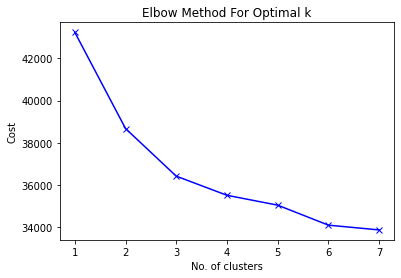

In [8]:
# Create the clustering dataset from socioeconomic and demographic data
cluster_df = cluster_df[dem_cols + soc_cols + ['category_awareness']]
cluster_df.dropna(inplace=True)

# Plot the data for k clusters to select a suitable number
cost = []
K = range(1, 8)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init="random", n_init=5, verbose=1, n_jobs=-1)
    kmode.fit_predict(cluster_df)
    cost.append(kmode.cost_)

plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [9]:
# Cluster the data and explore the medians from each cluster to understand them
kmode = KModes(n_clusters=3, init="random", n_init=5, verbose=1, n_jobs=-1)
clusters = kmode.fit_predict(cluster_df)
cluster_df.insert(0, "Cluster", clusters, True)
kmode.cluster_centroids_[0]

Best run was number 2


array(['25-34', 'Male', 'New York', 'Millennials', 'Suburban',
       'Single / Never married', 'Bachelors', 'not selected', 'White',
       'High School/Tertiary/Tech. College/College', 'Other',
       'Full-time work in the private sector', 'Other', 'Owned house',
       'Having just enough income not to struggle, but cannot save much',
       '$25,000 - $49,999', '$25,000 - $49,999', 'aware'], dtype='<U75')

In [10]:
kmode.cluster_centroids_[1]

array(['65 and above', 'Female', 'Florida', 'Baby boomers', 'Suburban',
       'Married', 'Empty nest 2', 'None', 'White',
       'High School/Tertiary/Tech. College/College',
       'Business / Economics', 'Retired', 'Other', 'Owned house',
       'Living comfortably on present income', '$25,000 - $49,999',
       '$25,000 - $49,999', 'aware'], dtype='<U75')

In [11]:
kmode.cluster_centroids_[2]

array(['45-54', 'Female', 'Texas', 'Generation X', 'Rural',
       'Single / Never married', 'Bachelors', 'None', 'White',
       'High School/Tertiary/Tech. College/College',
       'Does not apply / I am not studying / have not studied at university/college',
       'Full-time work in the private sector', 'Other', 'Owned house',
       'Having just enough income not to struggle, but cannot save much',
       '$10,000 - $24,999', '$1 - $24,999', 'unaware'], dtype='<U75')

In [12]:
# Profile each cluster to explore and understand the distribution of responses better
grouped = cluster_df.groupby('Cluster')

for grp in grouped:
    profile = pp.ProfileReport(grp[1], title=f'Qudo Dataset - Cluster {grp[0]}', explorative=True)
    profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Modelling Awareness

In [13]:
# load the whole dataset
df = pd.read_csv('data/qudo_data.csv')

# Remove columns with 'AIDA' - rationale in presentation
cols_to_drop = [x for x in df.columns if 'AIDA_WW' in x]
df.drop(['Time Started', 'Date Submitted', 'Language', 'Longitude', 'Latitude', 'Country', 'City', 'ID', 'Postal',
          'Getting a pass that allows entry to multiple attractions, sightseeing places, and museums:AIDA_WW_CAW_CB_07062021']
        + cols_to_drop, axis=1, inplace=True)

# Create a sparce, one-hot-encoded dataset
sparse_df = pd.get_dummies(df.drop('category_awareness', axis=1))

# Define support vector classifier algorithm
clf = LinearSVC(random_state=42)

# Test train split (20%)
x_train, x_test, y_train, y_test = train_test_split(sparse_df, df['category_awareness'], test_size=.2, random_state=42)

# Define the recursive feature elimination algorithm 
rfecv = RFECV(estimator=clf, step=1, cv=StratifiedKFold(5, random_state=0, shuffle=True),
              scoring='accuracy', n_jobs=-1)  # create RFECV model with 5 fold cross validation

rfecv = rfecv.fit(x_train, y_train)  # fit to data - will take a long time
rfecv_df = sparse_df.loc[:, rfecv.support_]  # create a data frame with only the selected features from RFECV
rfecv_df.to_csv('outputs/model_dfs/scv_rfecv_final.csv') # Save data

C:\Users\Russell\anaconda3\envs\qudo_assessement\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Russell\anaconda3\envs\qudo_assessement\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Russell\anaconda3\envs\qudo_assessement\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Russell\anaconda3\envs\qudo_assessement\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Russell\anaconda3\envs\qudo_assessement\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\Russell\ana

In [14]:
# Get model metrics

# New split of the reduced dataset 
x_train, x_test, y_train, y_test = train_test_split(rfecv_df, df['category_awareness'], test_size=.2, random_state=42)
clf.fit(x_train, y_train)  # fit to classifier
coefs_df = pd.DataFrame({'coefs': clf.coef_[0], 'features': rfecv_df.columns}) # Save coefficients to csv
coefs_df.to_csv('outputs/model_dfs/coefs_final.csv')
y_predict = clf.predict(x_test)  # create predictions for the data
x_score = clf.score(x_test, y_test)  # score predictions against acutal
classification_report(y_test, y_predict) # Show classification report

C:\Users\Russell\anaconda3\envs\qudo_assessement\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


'              precision    recall  f1-score   support\n\n       aware       0.67      0.67      0.67       448\n     unaware       0.58      0.57      0.57       348\n\n    accuracy                           0.63       796\n   macro avg       0.62      0.62      0.62       796\nweighted avg       0.63      0.63      0.63       796\n'

In [15]:
get_model_metrics(y_test, y_predict)

Sensitivity                  0.622973
Specificity                  0.622973
Precision                    0.623217
Negative prediction value    0.623217
False positive rate          0.377027
False negative rate          0.377027
False discovery rate         0.376783
Accuracy                     0.629397
dtype: float64